In [2]:
# import required libraries
import os
#import numpy as np
from tqdm import tqdm
from glob import glob
#from numpy import zeros
#from numpy.random import randint
import torch
import os
import cv2
from statistics import mean
from torch.nn.functional import threshold, normalize

# Data Viz
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [3]:
! pip install torch torchvision &> /dev/null
! pip install opencv-python pycocotools matplotlib &> /dev/null

# ==== Install Transformers for SegFormer ====
! pip install transformers pillow &> /dev/null

In [4]:
# === CONFIGURATION ===
# Set the path to your training images and labels
image_path = "/content/drive/MyDrive/canal_project/27_11_2025/train/images"   # <-- Update this path
label_path = "/content/drive/MyDrive/canal_project/27_11_2025/train/masks"    # <-- Update this path

# === Load Image Paths ===
# Count total number of image files (e.g., .jpg format)
all_image_paths = sorted(glob(os.path.join(image_path, "*.jpg")))  # Use .png if needed
total_images = len(all_image_paths)
print(f"Total Number of Images: {total_images}")

# === Load Label Paths ===
# Count total number of label files (e.g., .png format for segmentation masks)
all_label_paths = sorted(glob(os.path.join(label_path, "*.png")))
total_labels = len(all_label_paths)
print(f"Total Number of Labels: {total_labels}")

# === Match Images and Labels ===
# Assuming both are in matching order and of equal length
train_image_paths = all_image_paths[:total_images]
train_label_paths = all_label_paths[:total_labels]

# Preview label paths (for verification)
print("Sample label paths:")
for path in train_label_paths[:5]:
    print(path)

Total Number of Images: 186
Total Number of Labels: 186
Sample label paths:
/content/drive/MyDrive/canal_project/27_11_2025/train/masks/image_capture_2025-04-05_11-45-56_jpg.rf.3d31effc5cd44f2feb5ca1c2c219346b_mask.png
/content/drive/MyDrive/canal_project/27_11_2025/train/masks/image_capture_2025-04-06_10-10-41_jpg.rf.2d25833c6629824eb13665eb4b7a794c_mask.png
/content/drive/MyDrive/canal_project/27_11_2025/train/masks/image_capture_2025-04-06_11-10-42_jpg.rf.ddc1a4d0ad9d75799e5114aa78022e19_mask.png
/content/drive/MyDrive/canal_project/27_11_2025/train/masks/image_capture_2025-04-06_11-11-48_jpg.rf.6b1a6629a791c2c0c47e5ed49cca16ee_mask.png
/content/drive/MyDrive/canal_project/27_11_2025/train/masks/image_capture_2025-04-06_12-12-56_jpg.rf.a087e1490f708cdb45e28555f3786aaf_mask.png


In [5]:
# === CONFIGURATION ===
# Set the path to your validation images and labels
val_image_path = "/content/drive/MyDrive/canal_project/27_11_2025/valid/images"   # <-- Update this path
val_label_path = "/content/drive/MyDrive/canal_project/27_11_2025/valid/masks"    # <-- Update this path

# === Load Validation Image Paths ===
# Collect and sort all .jpg image files in the validation folder
val_all_image_paths = sorted(glob(os.path.join(val_image_path, "*.jpg")))
val_total_images = len(val_all_image_paths)
print(f"Total Number of Validation Images: {val_total_images}")

# === Load Validation Label Paths ===
# Collect and sort all .png label files in the validation folder
val_all_label_paths = sorted(glob(os.path.join(val_label_path, "*.png")))
val_total_labels = len(val_all_label_paths)
print(f"Total Number of Validation Labels: {val_total_labels}")

# === Match Images and Labels (by order) ===
# This assumes one-to-one correspondence between image and label files
Val1_image_paths = val_all_image_paths[:val_total_images]
Val1_label_paths = val_all_label_paths[:val_total_labels]

# Preview a few label paths to confirm loading
print("Sample validation label paths:")
for path in Val1_label_paths[:5]:
    print(path)

Total Number of Validation Images: 39
Total Number of Validation Labels: 39
Sample validation label paths:
/content/drive/MyDrive/canal_project/27_11_2025/valid/masks/image_capture_2025-04-05_11-44-49_jpg.rf.b321be12d6ab3078ae5064300cfb22ac_mask.png
/content/drive/MyDrive/canal_project/27_11_2025/valid/masks/image_capture_2025-04-07_11-37-39_jpg.rf.2fabed3881bc90ecc487ee025e0509cb_mask.png
/content/drive/MyDrive/canal_project/27_11_2025/valid/masks/image_capture_2025-04-08_11-04-35_jpg.rf.da8fbcd31f962ae95b3d5301f544de7e_mask.png
/content/drive/MyDrive/canal_project/27_11_2025/valid/masks/image_capture_2025-04-09_11-31-33_jpg.rf.f831b52a22d28ffa7e8e351d3e28381b_mask.png
/content/drive/MyDrive/canal_project/27_11_2025/valid/masks/image_capture_2025-05-19_12-47-22_jpg.rf.7deac398fbf7675b3cb73df0620b94d2_mask.png


In [6]:
# Please dont run this line if you would like to use the original size of input images.
desired_size=(640, 640)

In [7]:
# === Load and Process Ground Truth Masks ===
# This dictionary will store binary masks where pixel > 0 is treated as True
ground_truth_masks = {}

for idx in range(len(train_label_paths)):
    # Read the label mask in grayscale
    gt_grayscale = cv2.imread(train_label_paths[idx], cv2.IMREAD_GRAYSCALE)

    # Resize the mask if desired_size is specified
    if desired_size is not None:
        gt_grayscale = cv2.resize(gt_grayscale, desired_size, interpolation=cv2.INTER_LINEAR)

    # Convert to binary mask (True where pixel > 0)
    ground_truth_masks[idx] = (gt_grayscale > 0)

# Optional: Print number of masks and preview a sample
print(f"Total ground truth masks loaded: {len(ground_truth_masks)}")
print("Example binary mask shape:", ground_truth_masks[0].shape)


Total ground truth masks loaded: 186
Example binary mask shape: (640, 640)


In [8]:
# === Load and Process Validation Ground Truth Masks ===
# This dictionary will store binary masks for validation data
ground_truth_masksv = {}

for idx in range(len(Val1_label_paths)):
    # Read the validation label mask in grayscale
    gt_grayscale = cv2.imread(Val1_label_paths[idx], cv2.IMREAD_GRAYSCALE)

    # Resize the mask if a desired size is specified
    if desired_size is not None:
        gt_grayscale = cv2.resize(gt_grayscale, desired_size, interpolation=cv2.INTER_LINEAR)

    # Convert to binary mask: True where pixel > 0
    ground_truth_masksv[idx] = (gt_grayscale > 0)

# Print summary
print(f"Total validation ground truth masks loaded: {len(ground_truth_masksv)}")
print("Example validation mask shape:", ground_truth_masksv[0].shape)

Total validation ground truth masks loaded: 39
Example validation mask shape: (640, 640)


In [9]:
model_name = "nvidia/segformer-b0-finetuned-ade-512-512"  # Options: b0, b1, b2, b3, b4, b5
checkpoint = 'segformer_bo.pth'
device = 'cuda:0'

In [10]:
!pip install numpy==1.23.5 --force-reinstall &> /dev/null

In [11]:
# === Import Required SegFormer Modules ===
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor
import torch

# === Configuration ===
# Choose SegFormer model variant: b0 (smallest/fastest) to b5 (largest/most accurate)
model_name = "nvidia/segformer-b0-finetuned-ade-512-512"
# Options:
# - nvidia/segformer-b0-finetuned-ade-512-512
# - nvidia/segformer-b1-finetuned-ade-512-512
# - nvidia/segformer-b2-finetuned-ade-512-512
# - nvidia/segformer-b3-finetuned-ade-512-512
# - nvidia/segformer-b4-finetuned-ade-512-512
# - nvidia/segformer-b5-finetuned-ade-640-640

# === Load Model ===
# Initialize SegFormer for binary segmentation (num_labels=1)
model = SegformerForSemanticSegmentation.from_pretrained(
    model_name,
    num_labels=1,  # Binary segmentation (canal vs background)
    ignore_mismatched_sizes=True  # Allow loading pretrained weights with different output size
)

# === Load Image Processor ===
# Processor handles image preprocessing (resizing, normalization, etc.)
processor = SegformerImageProcessor.from_pretrained(model_name)

# Move model to GPU if available, otherwise CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# === Set Model to Training Mode ===
model.train()

print(f"SegFormer model ({model_name.split('/')[-1]}) loaded on {device} and set to training mode.")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/15.0M [00:00<?, ?B/s]

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([1]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([1, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


preprocessor_config.json:   0%|          | 0.00/271 [00:00<?, ?B/s]

SegFormer model (segformer-b0-finetuned-ade-512-512) loaded on cuda and set to training mode.


/usr/local/lib/python3.12/dist-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `SegformerImageProcessor.__init__` and were ignored: 'feature_extractor_type', 'reduce_labels'
  image_processor = cls(**image_processor_dict)


In [12]:
from collections import defaultdict
import cv2
import torch

# Preprocessed image data will be stored in this dictionary
transformed_data = defaultdict(dict)

# Define desired size (SegFormer standard)
desired_size = (640, 640)

# === Image Preprocessing Loop ===
successful_count = 0
failed_images = []

for idx in range(len(train_image_paths)):
    # Load image from path
    image = cv2.imread(train_image_paths[idx])

    # Check if image was loaded successfully
    if image is None:
        print(f"Failed to load image: {train_image_paths[idx]}")
        failed_images.append(train_image_paths[idx])
        continue

    # Resize if a fixed input size is specified
    if desired_size is not None:
        image = cv2.resize(image, desired_size, interpolation=cv2.INTER_LINEAR)

    # Convert BGR (OpenCV default) to RGB (SegFormer expects RGB)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Store original image size before processing
    original_size = image_rgb.shape[:2]  # (H, W)

    # Preprocess using SegFormer's image processor
    inputs = processor(images=image_rgb, return_tensors="pt")

    # Store processed data
    transformed_data[successful_count]['pixel_values'] = inputs['pixel_values'].squeeze(0)
    transformed_data[successful_count]['original_size'] = original_size

    successful_count += 1

    # Progress indicator
    if (idx + 1) % 50 == 0:
        print(f"Processed {idx + 1}/{len(train_image_paths)} images...")

print(f"\n✓ Successfully processed {successful_count} training images for SegFormer input.")

if failed_images:
    print(f"Failed to load {len(failed_images)} images")
else:
    print("✓ All images loaded successfully!")

Processed 50/186 images...
Processed 100/186 images...
Processed 150/186 images...

✓ Successfully processed 186 training images for SegFormer input.
✓ All images loaded successfully!


In [14]:
# === Training Hyperparameters ===
lr = 1e-5                     # Learning rate for optimizer (can try 1e-4 or 5e-5 for SegFormer)
wd = 0.01                     # Weight decay (L2 regularization) - SegFormer typically uses 0.01
batch_size = 32                # Number of samples per batch (reduced from 32 - SegFormer uses more memory)
num_epochs = 5                # Total number of training epochs

# === Optimizer Setup ===
# Fine-tune all SegFormer parameters (or specify which layers to freeze if needed)
optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)

# Alternative: Use AdamW (recommended for transformers)
# optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=wd)

# === Loss Function ===
# Binary Cross Entropy with logits for binary segmentation
loss_fn = torch.nn.BCEWithLogitsLoss()

# === Device Setup ===
# Automatically use GPU if available, otherwise fallback to CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# === Ground Truth Mask Keys ===
# These lists are used to index into your ground truth dictionaries
keys_train = list(ground_truth_masks.keys())
keys_valid = list(ground_truth_masksv.keys())

print(f"Using device: {device}")
print(f"Training on {len(keys_train)} images, validating on {len(keys_valid)} images")
print(f"Batch size: {batch_size}, Learning rate: {lr}")

Using device: cuda
Training on 186 images, validating on 39 images
Batch size: 32, Learning rate: 1e-05


In [15]:

from torch.utils.data import DataLoader

# === Validation DataLoader Setup ===
# Here we're using a list of file paths as the dataset, which will later need to be wrapped in a proper Dataset class
val_loader = DataLoader(Val1_image_paths, batch_size=batch_size, shuffle=False)

# === Basic Validation Dataset Checks ===

# Total number of validation examples
num_val_examples = len(Val1_image_paths)
print(f"Number of validation examples: {num_val_examples}")

# Number of items returned by val_loader.dataset (same as above since it's a list)
print(f"Number of examples in validation dataset (via DataLoader): {len(val_loader.dataset)}")

# Number of batches in the validation DataLoader
print(f"Number of batches in validation loader: {len(val_loader)}")

# === Safety Check ===
# Prevent training from continuing if validation data is empty
if num_val_examples == 0:
    raise ValueError("The validation dataset is empty. Please check your data paths.")

Number of validation examples: 39
Number of examples in validation dataset (via DataLoader): 39
Number of batches in validation loader: 2


In [16]:
import numpy as np
import cv2
from statistics import mean

# === Accuracy Calculation Function ===
def calculate_accuracy(predictions, targets):
    """
    Computes binary accuracy between predicted and ground truth masks.
    """
    binary_predictions = (predictions > 0.5).float()
    accuracy = (binary_predictions == targets).float().mean()
    return accuracy.item()

# === Batch Training Function ===
def train_on_batch(keys, batch_start, batch_end):
    """
    Trains the SegFormer model on a batch of images and masks.
    Returns batch loss and accuracy.
    """
    batch_losses = []
    batch_accuracies = []

    for k in keys[batch_start:batch_end]:
        # === Get input data
        pixel_values = transformed_data[k]['pixel_values'].unsqueeze(0).to(device)
        original_size = transformed_data[k]['original_size']

        # === Forward Pass
        outputs = model(pixel_values=pixel_values)
        logits = outputs.logits  # Shape: (batch, num_labels, H, W)

        # === Upsample to original size
        upsampled_logits = torch.nn.functional.interpolate(
            logits,
            size=original_size,
            mode='bilinear',
            align_corners=False
        )

        # Squeeze to remove class dimension (since we have 1 class)
        upsampled_logits = upsampled_logits.squeeze(1)  # Shape: (batch, H, W)

        # === Load ground truth mask
        gt_mask = ground_truth_masks[k]
        gt_tensor = torch.from_numpy(gt_mask.astype(np.float32)).unsqueeze(0).to(device)

        # === Compute loss and update weights
        loss = loss_fn(upsampled_logits, gt_tensor)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # === Record metrics
        batch_losses.append(loss.item())
        with torch.no_grad():
            batch_accuracies.append(calculate_accuracy(torch.sigmoid(upsampled_logits), gt_tensor))

    return batch_losses, batch_accuracies

# === Define training keys ===
keys = list(transformed_data.keys())

# === Epoch Training Loop ===
losses, accuracies = [], []

for epoch in range(num_epochs):
    epoch_losses = []
    epoch_accuracies = []

    print(f"\n--- EPOCH {epoch + 1}/{num_epochs} ---")
    model.train()

    for batch_start in range(0, len(keys), batch_size):
        batch_end = min(batch_start + batch_size, len(keys))
        batch_losses, batch_accuracies = train_on_batch(keys, batch_start, batch_end)

        batch_loss = mean(batch_losses)
        batch_accuracy = mean(batch_accuracies)

        epoch_losses.append(batch_loss)
        epoch_accuracies.extend(batch_accuracies)

        print(f'Batch [{batch_start + 1}–{batch_end}] | Loss: {batch_loss:.6f} | Accuracy: {batch_accuracy:.4f}')

    # === End of Epoch ===
    mean_train_loss = mean(epoch_losses)
    mean_train_accuracy = mean(epoch_accuracies)
    losses.append(mean_train_loss)
    accuracies.append(mean_train_accuracy)

    print(f'\nEpoch {epoch + 1} Summary:')
    print(f'➤ Mean Training Loss: {mean_train_loss:.6f}')
    print(f'➤ Mean Training Accuracy: {mean_train_accuracy:.4f}')

    # Clear cache to manage memory
    torch.cuda.empty_cache()

print("\n✓ Training completed!")


--- EPOCH 1/5 ---
Batch [1–32] | Loss: 0.564644 | Accuracy: 0.8816
Batch [33–64] | Loss: 0.491266 | Accuracy: 0.9427
Batch [65–96] | Loss: 0.472464 | Accuracy: 0.9347
Batch [97–128] | Loss: 0.449110 | Accuracy: 0.9595
Batch [129–160] | Loss: 0.429194 | Accuracy: 0.9560
Batch [161–186] | Loss: 0.404205 | Accuracy: 0.9657

Epoch 1 Summary:
➤ Mean Training Loss: 0.468480
➤ Mean Training Accuracy: 0.9392

--- EPOCH 2/5 ---
Batch [1–32] | Loss: 0.368458 | Accuracy: 0.9658
Batch [33–64] | Loss: 0.348762 | Accuracy: 0.9773
Batch [65–96] | Loss: 0.340257 | Accuracy: 0.9734
Batch [97–128] | Loss: 0.340438 | Accuracy: 0.9797
Batch [129–160] | Loss: 0.334367 | Accuracy: 0.9743
Batch [161–186] | Loss: 0.315517 | Accuracy: 0.9807

Epoch 2 Summary:
➤ Mean Training Loss: 0.341300
➤ Mean Training Accuracy: 0.9750

--- EPOCH 3/5 ---
Batch [1–32] | Loss: 0.290065 | Accuracy: 0.9784
Batch [33–64] | Loss: 0.276557 | Accuracy: 0.9824
Batch [65–96] | Loss: 0.282657 | Accuracy: 0.9774
Batch [97–128] | Loss:

In [17]:
print(type(ground_truth_masksv))
print(ground_truth_masksv.keys() if isinstance(ground_truth_masksv, dict) else len(ground_truth_masksv))

<class 'dict'>
dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38])


In [18]:

# Set the paths to your test images and labels
test_image_dir = "/content/drive/MyDrive/canal_project/27_11_2025/test/images"  # <-- Update this path
test_label_dir = "/content/drive/MyDrive/canal_project/27_11_2025/test/masks"   # <-- Update this path

# === Load and Sort Test Image Paths ===
# Collect all test image files (e.g., .jpg)
all_test_image_paths = sorted(glob(os.path.join(test_image_dir, "*.jpg")))
test_total_images = len(all_test_image_paths)
print(f"Total Number of Test Images: {test_total_images}")

# === Load and Sort Test Label Paths ===
# Collect all test label files (e.g., .png masks)
all_test_label_paths = sorted(glob(os.path.join(test_label_dir, "*.png")))
test_total_labels = len(all_test_label_paths)
print(f"Total Number of Test Labels: {test_total_labels}")

# === Match Image and Label Paths ===
# These lists can now be used for DataLoader or evaluation
Test_image_paths = all_test_image_paths[:test_total_images]
Test_label_paths = all_test_label_paths[:test_total_labels]

# Optional: Print a few samples to verify
print("Sample test image path:", Test_image_paths[0] if Test_image_paths else "No images found")
print("Sample test label path:", Test_label_paths[0] if Test_label_paths else "No labels found")

Total Number of Test Images: 40
Total Number of Test Labels: 40
Sample test image path: /content/drive/MyDrive/canal_project/27_11_2025/test/images/image_capture_2025-04-06_12-11-49_jpg.rf.826be63e91371c207d97f6472d9d495b.jpg
Sample test label path: /content/drive/MyDrive/canal_project/27_11_2025/test/masks/image_capture_2025-04-06_12-11-49_jpg.rf.826be63e91371c207d97f6472d9d495b_mask.png


In [19]:

# Dictionary to hold ground truth binary masks for test data
ground_truth_test_masks = {}

# === Load and Process Each Test Mask ===
for idx in range(len(Test_label_paths)):
    # Read label image in color (3-channel); expected mask is in the red channel
    gt_color = cv2.imread(Test_label_paths[idx])

    # Extract the red channel only and convert to binary mask
    # Note: OpenCV loads in BGR, so red is at index 2
    binary_mask = (gt_color[:, :, 2] > 0).astype(np.float32)

    # Resize if specified
    if desired_size is not None:
        binary_mask = cv2.resize(binary_mask, desired_size, interpolation=cv2.INTER_NEAREST)

    # Store in dictionary
    ground_truth_test_masks[idx] = binary_mask

print(f"Loaded {len(ground_truth_test_masks)} ground truth test masks.")

Loaded 40 ground truth test masks.


In [20]:
import torch
import cv2
import numpy as np

# Set model to evaluation mode
model.eval()

masks_tuned_list = {}   # Stores predicted binary masks
images_tuned_list = {}  # Stores input images used during inference

with torch.no_grad():  # Disable gradient computation for inference
    for idx in range(len(Test_image_paths)):
        # === Load and Preprocess Image ===
        image = cv2.imread(Test_image_paths[idx])
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        if desired_size is not None:
            image_rgb = cv2.resize(image_rgb, desired_size, interpolation=cv2.INTER_LINEAR)

        # Store original size
        original_size = image_rgb.shape[:2]  # (H, W)

        # === Preprocess image with SegFormer processor ===
        inputs = processor(images=image_rgb, return_tensors="pt")
        pixel_values = inputs['pixel_values'].to(device)

        # === Predict segmentation mask ===
        outputs = model(pixel_values=pixel_values)
        logits = outputs.logits  # Shape: (batch, num_labels, H, W)

        # === Upsample to original size ===
        upsampled_logits = torch.nn.functional.interpolate(
            logits,
            size=original_size,
            mode='bilinear',
            align_corners=False
        )

        # Squeeze to remove batch and class dimensions
        upsampled_logits = upsampled_logits.squeeze()  # Shape: (H, W)

        # === Apply sigmoid and threshold to get binary mask ===
        prob_mask = torch.sigmoid(upsampled_logits)
        binary_mask = (prob_mask > 0.5).cpu().numpy().astype(np.float32)

        # === Store results ===
        images_tuned_list[idx] = image_rgb
        masks_tuned_list[idx] = binary_mask

        # Progress indicator
        if (idx + 1) % 10 == 0:
            print(f"Processed {idx + 1}/{len(Test_image_paths)} test images...")

print(f"\n Inference complete on {len(Test_image_paths)} test images.")

Processed 10/40 test images...
Processed 20/40 test images...
Processed 30/40 test images...
Processed 40/40 test images...

 Inference complete on 40 test images.


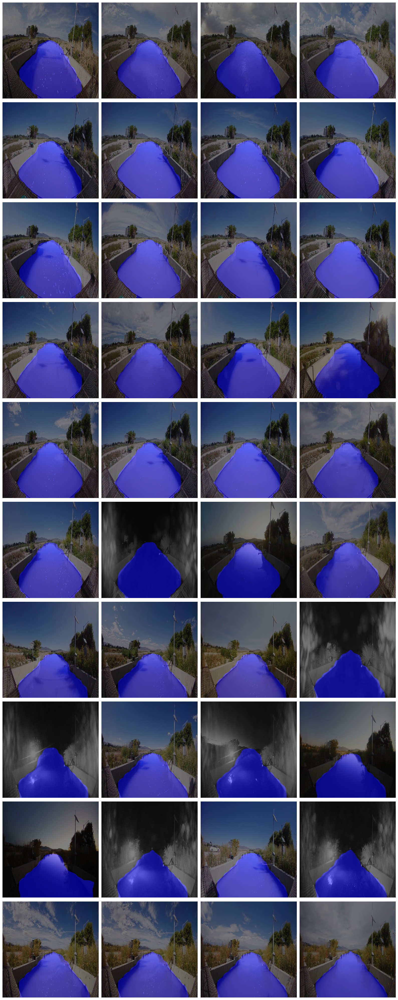

In [21]:

import matplotlib.pyplot as plt
import numpy as np

# === Grid Configuration ===
n_images = len(images_tuned_list)
n_cols = 4  # Number of images per row
n_rows = (n_images // n_cols) + (n_images % n_cols > 0)  # Auto-calculate rows

# Create a figure with subplots
fig, axs = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))

# If axs is 1D (e.g., only 1 row), convert to 2D for consistency
axs = np.atleast_2d(axs)

# === Iterate and Plot ===
for i in range(n_rows):
    for j in range(n_cols):
        index = i * n_cols + j
        ax = axs[i, j]

        if index < n_images:
            # Display the RGB image
            ax.imshow(images_tuned_list[index], interpolation='none')

            # Generate a blue mask overlay (R=0, G=0, B=1) for binary mask = 1
            mask = masks_tuned_list[index]
            blue_mask_rgb = np.zeros((*mask.shape, 3), dtype=np.float32)
            blue_mask_rgb[..., 2] = mask  # Blue channel

            # Overlay the mask with transparency
            ax.imshow(blue_mask_rgb, alpha=0.5)

        # Remove axes ticks
        ax.axis('off')

# === Final Layout ===
plt.subplots_adjust(wspace=0.03, hspace=0.03)
plt.tight_layout()
plt.show()

In [22]:
import torch
import numpy as np
from sklearn.metrics import auc, roc_curve

# === Binary Metrics for One Prediction ===
def binary_segmentation_metrics(predictions, targets):
    """
    Computes binary segmentation metrics for a single predicted mask vs ground truth.
    Inputs:
        predictions (numpy array): predicted mask, float32, range [0,1] or binary
        targets (numpy array): ground truth mask, binary (0 or 1)
    Returns:
        Tuple of metrics: accuracy, precision, recall, F1-score, IoU, kappa, FP, FN, TP, TN, dice
    """
    # Flatten and convert to binary
    predictions = predictions.squeeze()
    targets = targets.squeeze()

    predictions_binary = (predictions > 0.5).astype(int)
    targets_binary = targets.astype(int)

    # Confusion matrix components
    TP = np.sum((predictions_binary == 1) & (targets_binary == 1))
    FP = np.sum((predictions_binary == 1) & (targets_binary == 0))
    FN = np.sum((predictions_binary == 0) & (targets_binary == 1))
    TN = np.sum((predictions_binary == 0) & (targets_binary == 0))

    # Metrics with small epsilon to avoid division by zero
    eps = 1e-5
    accuracy = (TP + TN + eps) / (TP + FP + FN + TN + eps)
    precision = (TP + eps) / (TP + FP + eps)
    recall = (TP + eps) / (TP + FN + eps)
    f_score = 2 * (precision * recall) / (precision + recall + eps)
    dice = (2 * TP + eps) / (2 * TP + FP + FN + eps)
    iou = (TP + eps) / (TP + FP + FN + eps)

    # Cohen’s kappa
    total = TP + FP + FN + TN
    p_o = (TP + TN) / total
    p_e = ((TP + FP) * (TP + FN) + (FN + TN) * (FP + TN)) / (total ** 2)
    kappa = (p_o - p_e) / (1 - p_e + eps)

    return accuracy, precision, recall, f_score, iou, kappa, FP, FN, TP, TN, dice

# === Average Metrics Across Dataset ===
def calculate_average_metrics(predictions_list, targets_list):
    """
    Computes average binary segmentation metrics across a dataset.
    Inputs:
        predictions_list: dictionary or list of predicted masks
        targets_list: dictionary or list of ground truth masks
    Returns:
        Dictionary of averaged metrics
    """
    num_masks = len(predictions_list)

    total_metrics = {
        'accuracy': 0.0, 'precision': 0.0, 'recall': 0.0, 'f_score': 0.0,
        'iou': 0.0, 'kappa': 0.0, 'FP': 0, 'FN': 0, 'MAR': 0.0, 'FAR': 0.0, 'dice': 0.0
    }

    for i in range(num_masks):
        pred = predictions_list[i]
        gt = targets_list[i]
        metrics = binary_segmentation_metrics(pred, gt)

        # Accumulate each metric
        for metric_name, value in zip(total_metrics.keys(), metrics):
            total_metrics[metric_name] += value

        # Add False Negative Rate (Missed Alarm Rate, MAR) and False Alarm Rate (FAR)
        TP, TN, FP, FN = metrics[8], metrics[9], metrics[6], metrics[7]
        total_metrics['MAR'] += FN / (FN + TP + 1e-5)
        total_metrics['FAR'] += FP / (FP + TN + 1e-5)

    # Compute mean for each metric
    avg_metrics = {k: v / num_masks for k, v in total_metrics.items()}

    return avg_metrics

# === Example Usage ===
# Evaluate the SAM predictions vs. ground truth test masks
avg_metrics = calculate_average_metrics(masks_tuned_list, ground_truth_test_masks)

# Print results
print("\n=== Average Metrics on Test Set ===")
for metric_name, value in avg_metrics.items():
    print(f"{metric_name.upper():<8}: {value:.4f}")


=== Average Metrics on Test Set ===
ACCURACY: 0.9833
PRECISION: 0.9397
RECALL  : 0.9941
F_SCORE : 0.9660
IOU     : 0.9345
KAPPA   : 0.9549
FP      : 6264.0250
FN      : 583.4250
MAR     : 98229.5309
FAR     : 304523.0451
DICE    : 0.9660


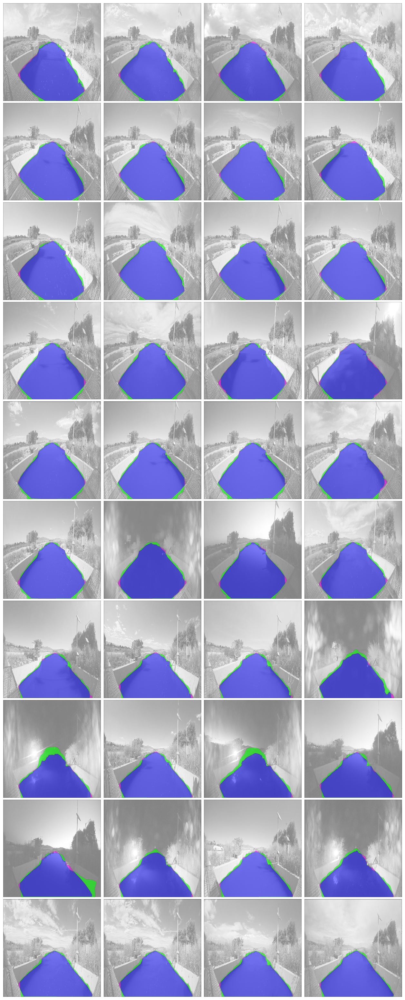

Visualization saved to: ./ViTSAM_Evaluation_Overlay.png


In [23]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from skimage.color import rgb2gray
import math

# === Configuration ===
border_color = 'black'
border_width = 0.35
alpha_gray = 0.5  # transparency for base grayscale image
alpha_tp = 0.5    # transparency for True Positives (blue)
alpha_fa = 0.6    # False Alarms (green)
alpha_ma = 0.6    # Missed Alarms (magenta)

# === Determine Grid Layout ===
num_images = len(images_tuned_list)
cols = 4
rows = math.ceil(num_images / cols)

# === Setup Plot ===
fig, axs = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
axs = axs.flatten()  # flatten 2D axes array for 1D indexing

# === Choose Which Images to Display (all by default) ===
selected_indices = list(range(num_images))

# === Visualization Loop ===
for i, index in enumerate(selected_indices):
    if index >= num_images:
        break

    # Convert image to grayscale
    gray_image = rgb2gray(images_tuned_list[index])

    # Get predicted and ground truth masks
    pred_mask = masks_tuned_list[index]
    gt_mask = ground_truth_test_masks[index]

    ax = axs[i]
    ax.imshow(gray_image, cmap='gray', interpolation='none', alpha=alpha_gray)

    # === Mask Overlays ===

    # True Positives: prediction and ground truth both 1 (blue)
    tp_mask = (pred_mask == 1) & (gt_mask == 1)
    tp_rgba = np.stack([np.zeros_like(tp_mask), np.zeros_like(tp_mask), tp_mask], axis=-1)
    tp_rgba = np.concatenate([tp_rgba, tp_mask[..., None].astype(float)], axis=-1)
    ax.imshow(tp_rgba, alpha=alpha_tp)

    # False Alarms: prediction is 1, ground truth is 0 (green)
    fa_mask = (pred_mask == 1) & (gt_mask == 0)
    fa_rgba = np.stack([np.zeros_like(fa_mask), fa_mask, np.zeros_like(fa_mask)], axis=-1)
    fa_rgba = np.concatenate([fa_rgba, fa_mask[..., None].astype(float)], axis=-1)
    ax.imshow(fa_rgba, alpha=alpha_fa)

    # Missed Alarms: prediction is 0, ground truth is 1 (magenta)
    ma_mask = (pred_mask == 0) & (gt_mask == 1)
    ma_rgba = np.stack([ma_mask, np.zeros_like(ma_mask), ma_mask], axis=-1)
    ma_rgba = np.concatenate([ma_rgba, ma_mask[..., None].astype(float)], axis=-1)
    ax.imshow(ma_rgba, alpha=alpha_ma)

    # Add black border
    ax.add_patch(Rectangle((0, 0), gray_image.shape[1], gray_image.shape[0],
                           linewidth=border_width, edgecolor=border_color, facecolor='none'))

    ax.axis('off')

# === Turn Off Any Unused Axes ===
for j in range(len(selected_indices), len(axs)):
    axs[j].axis('off')

# === Save and Show ===
plt.subplots_adjust(wspace=0.02, hspace=0.02)
output_path = "./ViTSAM_Evaluation_Overlay.png"  # <-- Update path as needed
plt.savefig(output_path, dpi=600, bbox_inches='tight')
plt.show()

print(f"Visualization saved to: {output_path}")


In [24]:
import numpy as np

# === Metric Computation Function ===
def binary_segmentation_metrics(predictions, targets):
    predictions = predictions.squeeze()
    targets = targets.squeeze()
    predictions_binary = (predictions > 0.5).astype(int)
    targets_binary = targets.astype(int)

    TP = np.sum((predictions_binary == 1) & (targets_binary == 1))
    FP = np.sum((predictions_binary == 1) & (targets_binary == 0))
    FN = np.sum((predictions_binary == 0) & (targets_binary == 1))
    TN = np.sum((predictions_binary == 0) & (targets_binary == 0))

    eps = 1e-5
    accuracy = (TP + TN + eps) / (TP + FP + FN + TN + eps)
    precision = (TP + eps) / (TP + FP + eps)
    recall = (TP + eps) / (TP + FN + eps)
    f_score = 2 * (precision * recall) / (precision + recall + eps)
    dice = (2 * TP + eps) / (2 * TP + FP + FN + eps)
    iou = (TP + eps) / (TP + FP + FN + eps)

    total = TP + FP + FN + TN
    p_o = (TP + TN) / total
    p_e = ((TP + FP) * (TP + FN) + (FN + TN) * (FP + TN)) / (total ** 2)
    kappa = (p_o - p_e) / (1 - p_e + eps)

    return accuracy, precision, recall, f_score, iou, kappa, FP, FN, TP, TN, dice

# === Categorization Function ===
def categorize_metric(value, metric):
    categories = {
        'IoU': [(0.90, 'Excellent'), (0.85, 'Good'), (0.75, 'Fair'), (0.65, 'Poor'), (0, 'Unacceptable')],
        'Precision': [(0.95, 'Excellent'), (0.85, 'Good'), (0.65, 'Moderate'), (0, 'Fail')],
        'Kappa': [(0.88, 'Excellent'), (0.78, 'Good'), (0.68, 'Moderate'), (0, 'Fail')],
        'F-Score': [(0.88, 'Excellent'), (0.78, 'Good'), (0.68, 'Moderate'), (0, 'Fail')],
        'Recall': [(0.88, 'Excellent'), (0.78, 'Good'), (0.68, 'Moderate'), (0, 'Fail')]
    }

    if metric in categories:
        for threshold, label in categories[metric]:
            if value >= threshold:
                return label
    return "Unknown"

# === Compute Metrics for All Images ===
def compute_all_metrics(predictions_list, targets_list):
    all_metrics = []
    for i in range(len(predictions_list)):
        metrics = binary_segmentation_metrics(predictions_list[i], targets_list[i])
        metric_names = ['Accuracy', 'Precision', 'Recall', 'F-Score', 'IoU', 'Kappa', 'FP', 'FN', 'TP', 'TN', 'Dice']
        metric_dict = dict(zip(metric_names, metrics))

        # Add categorized versions
        for name in ['IoU', 'Precision', 'Kappa', 'F-Score', 'Recall']:
            metric_dict[f'{name}_Category'] = categorize_metric(metric_dict[name], name)

        all_metrics.append(metric_dict)
    return all_metrics

# === Summarize Counts and Percentages ===
def summarize_category_counts(metrics_list, metric_name, labels):
    counts = {label: 0 for label in labels}
    total = len(metrics_list)

    for m in metrics_list:
        category = m.get(f"{metric_name}_Category")
        if category in counts:
            counts[category] += 1

    # Print summary
    print(f"Counts and Percentages of Images in Each Category for {metric_name}:")
    for label in labels:
        count = counts[label]
        percentage = (count / total) * 100
        print(f"{label}: {count} ({percentage:.2f}%)")
    print()

# === Run All ===
metrics_list = compute_all_metrics(masks_tuned_list, ground_truth_test_masks)

summarize_category_counts(metrics_list, 'IoU',        ['Excellent', 'Good', 'Fair', 'Poor', 'Unacceptable'])
summarize_category_counts(metrics_list, 'Precision',  ['Excellent', 'Good', 'Moderate', 'Fail'])
summarize_category_counts(metrics_list, 'Kappa',      ['Excellent', 'Good', 'Moderate', 'Fail'])
summarize_category_counts(metrics_list, 'F-Score',    ['Excellent', 'Good', 'Moderate', 'Fail'])
summarize_category_counts(metrics_list, 'Recall',     ['Excellent', 'Good', 'Moderate', 'Fail'])


Counts and Percentages of Images in Each Category for IoU:
Excellent: 37 (92.50%)
Good: 3 (7.50%)
Fair: 0 (0.00%)
Poor: 0 (0.00%)
Unacceptable: 0 (0.00%)

Counts and Percentages of Images in Each Category for Precision:
Excellent: 6 (15.00%)
Good: 34 (85.00%)
Moderate: 0 (0.00%)
Fail: 0 (0.00%)

Counts and Percentages of Images in Each Category for Kappa:
Excellent: 40 (100.00%)
Good: 0 (0.00%)
Moderate: 0 (0.00%)
Fail: 0 (0.00%)

Counts and Percentages of Images in Each Category for F-Score:
Excellent: 40 (100.00%)
Good: 0 (0.00%)
Moderate: 0 (0.00%)
Fail: 0 (0.00%)

Counts and Percentages of Images in Each Category for Recall:
Excellent: 40 (100.00%)
Good: 0 (0.00%)
Moderate: 0 (0.00%)
Fail: 0 (0.00%)

